### Import Data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import glob
from glob import glob

import numpy as np
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
!unzip /content/drive/MyDrive/cs284/archive.zip

Archive:  /content/drive/MyDrive/cs284/archive.zip
  inflating: Dataset_BUSI_with_GT/benign/benign (1).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (1)_mask.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (10).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (10)_mask.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (100).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (100)_mask.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (100)_mask_1.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (101).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (101)_mask.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (102).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (102)_mask.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (103).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (103)_mask.png  
  inflating: Dataset_BUSI_with_GT/benign/benign (104).png  
  inflating: Dataset_BUSI_with_GT/benign/benign (104)_mask.png  
  inflating: 

### Explore Data of Each Classes

In [ ]:
paths = glob('/content/Dataset_BUSI_with_GT/*/*')

print(f"'normal' class has {len([i for i in paths if 'normal' in i and 'mask' not in i])} images and {len([i for i in paths if 'normal' in i and 'mask' in i])} masks.")
print(f"'benign' class has {len([i for i in paths if 'benign' in i and 'mask' not in i])} images and {len([i for i in paths if 'benign' in i and 'mask' in i])} masks.")
print(f"'malignant' class has {len([i for i in paths if 'malignant' in i and 'mask' not in i])} images and {len([i for i in paths if 'malignant' in i and 'mask' in i])} masks.")
print(f"\nThere are total of {len([i for i in paths if 'mask' not in i])} images and {len([i for i in paths if 'mask' in i])} masks.")

'normal' class has 133 images and 133 masks.
'benign' class has 437 images and 454 masks.
'malignant' class has 210 images and 211 masks.

There are total of 780 images and 798 masks.


In [ ]:
!pip uninstall pycococreator

In [ ]:
#!/usr/bin/env python3

import os
import re
import datetime
import numpy as np
from itertools import groupby
from skimage import measure
from PIL import Image
from pycocotools import mask

convert = lambda text: int(text) if text.isdigit() else text.lower()
natrual_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ]

def resize_binary_mask(array, new_size):
    image = Image.fromarray(array.astype(np.uint8)*255)
    image = image.resize(new_size)
    return np.asarray(image).astype(np.bool_)

def close_contour(contour):
    if not np.array_equal(contour[0], contour[-1]):
        contour = np.vstack((contour, contour[0]))
    return contour

def binary_mask_to_rle(binary_mask):
    rle = {'counts': [], 'size': list(binary_mask.shape)}
    counts = rle.get('counts')
    for i, (value, elements) in enumerate(groupby(binary_mask.ravel(order='F'))):
        if i == 0 and value == 1:
                counts.append(0)
        counts.append(len(list(elements)))

    return rle

def binary_mask_to_polygon(binary_mask, tolerance=0):
    """Converts a binary mask to COCO polygon representation

    Args:
        binary_mask: a 2D binary numpy array where '1's represent the object
        tolerance: Maximum distance from original points of polygon to approximated
            polygonal chain. If tolerance is 0, the original coordinate array is returned.

    """
    polygons = []
    # pad mask to close contours of shapes which start and end at an edge
    padded_binary_mask = np.pad(binary_mask, pad_width=1, mode='constant', constant_values=0)
    contours = measure.find_contours(padded_binary_mask, 0.5)
    contours = np.subtract(contours, 1)
    for contour in contours:
        contour = close_contour(contour)
        contour = measure.approximate_polygon(contour, tolerance)
        if len(contour) < 3:
            continue
        contour = np.flip(contour, axis=1)
        segmentation = contour.ravel().tolist()
        # after padding and subtracting 1 we may get -0.5 points in our segmentation
        segmentation = [0 if i < 0 else i for i in segmentation]
        polygons.append(segmentation)

    return polygons

def create_image_info(image_id, file_name, image_size,
                      date_captured=datetime.datetime.utcnow().isoformat(' '),
                      license_id=1, coco_url="", flickr_url=""):

    image_info = {
            "id": image_id,
            "file_name": file_name,
            "width": image_size[0],
            "height": image_size[1],
            "date_captured": date_captured,
            "license": license_id,
            "coco_url": coco_url,
            "flickr_url": flickr_url
    }

    return image_info

def compute_bounding_box(mask):
    """
    Compute the bounding box coordinates for a mask.
    mask: [height, width, 1] Mask of the object.
    Returns a tuple (y1, x1, y2, x2) of the bounding box.
    """
    np.set_printoptions(threshold=np.inf)
    print(mask)
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    if not np.any(rows) or not np.any(cols):
        # No object in the mask, return None
        return None
    y1, y2 = np.where(rows)[0][[0, -1]]
    x1, x2 = np.where(cols)[0][[0, -1]]

    return [int(y1), int(x1), int(y2), int(x2)]

def create_annotation_info(annotation_id, image_id, category_info, binary_mask,
                           image_size=None, tolerance=2, bounding_box=None):

    if image_size is not None:
        binary_mask = resize_binary_mask(binary_mask, image_size)
    print(binary_mask.shape)
    binary_mask_encoded = mask.encode(np.asfortranarray(binary_mask.astype(np.uint8)))

    area = mask.area(binary_mask_encoded)
    if area < 1:
        return None

    if bounding_box is None:
        bounding_box = mask.toBbox(binary_mask_encoded)

    if category_info["is_crowd"]:
        is_crowd = 1
        segmentation = binary_mask_to_rle(binary_mask)
    else :
        is_crowd = 0
        segmentation = binary_mask_to_polygon(binary_mask, tolerance)
        if not segmentation:
            return None

    annotation_info = {
        "id": annotation_id,
        "image_id": image_id,
        "category_id": category_info["id"],
        "iscrowd": is_crowd,
        "area": area.tolist(),
        "bbox": bounding_box.tolist(),
        "segmentation": segmentation,
        "width": binary_mask.shape[1],
        "height": binary_mask.shape[0],
    }

    return annotation_info

In [ ]:
import os
import re
from collections import defaultdict
from sklearn.model_selection import train_test_split
import shutil
import numpy as np
import cv2
import json

# Define the dataset path
dataset_path = "/content/Dataset_BUSI_with_GT"  # Update this to your dataset's path
new_dataset_path = "/content/BUSI"

# Classes in the dataset
classes = ["normal", "benign", "malignant"]

import cv2
import numpy as np

def get_category_from_image_name(image_name):
    if "normal" in image_name:
        return 1  # Category for 'normal'
    elif "benign" in image_name:
        return 2  # Category for 'benign'
    elif "malignant" in image_name:
        return 3
    else: return 0

def create_coco_json(image_mask_pairs, dest_folder):
    coco_data = {
        "info": {},
        "licenses": [],
        "categories": [
            {"id": 1, "name": "normal"},
            {"id": 2, "name": "benign"},
            {"id": 3, "name": "malignant"}
        ],
        "images": [],
        "annotations": []
    }

    annotation_id = 1
    for image_name, mask_files in image_mask_pairs.items():
        image_id = int(re.search(r'\d+', image_name).group())  # Extracting numeric ID from the image name
        img = cv2.imread(f"{dataset_path}/{dest_folder}/{image_name}.png")
        image_info = create_image_info(
            annotation_id, os.path.join(image_name + ".png"), (img.shape[1], img.shape[0]))
        coco_data["images"].append(image_info)

        # Add annotation for the combined mask

        mask_path = f"{dataset_path}/{dest_folder}/mask/{image_name}_combined_mask.png"
        cur_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        _, binary_mask = cv2.threshold(cur_mask, thresh=127, maxval=255, type=cv2.THRESH_BINARY)
        category_id = get_category_from_image_name(image_name)
        if category_id == 0:
            continue
        category_info = {"id": category_id,
                         "is_crowd": 0}
        annotation_info = create_annotation_info(
                annotation_id, image_info['id'], category_info, binary_mask)
        # print(image_info["file_name"], annotation_info["category_id"])

        if annotation_info is not None:
            coco_data["annotations"].append(annotation_info)
        # print(annotation_id, len(coco_data["images"]))
        annotation_id += 1
    print(annotation_id, len(coco_data["images"]))

    # Write the COCO data to a JSON file
    json_path = f"{dataset_path}/{dest_folder}/coco.json"
    with open(json_path, 'w') as json_file:
        json.dump(coco_data, json_file, indent=4)

    return json_path

# Splitting and moving files
def split_move_files(image_mask_pairs, dest_folder):
    for image_name, mask_files in image_mask_pairs.items():
        combined_mask = combine_masks(mask_files, image_name, dest_folder)
        file = image_name + ".png"
        src_path = f"{dataset_path}/{class_name}/{file}"
        dest_path = f"{dataset_path}/{dest_folder}/{file}"
        os.makedirs(os.path.dirname(dest_path), exist_ok=True)
        shutil.copy(src_path, dest_path)



In [ ]:
# Process each class
train_pairs, test_pairs, valid_pairs = [], [], []
for class_name in classes:
    # List image and mask pairs
    image_mask_pairs = list_image_masks(class_name)
    # Split into train, test, and validation sets
    cls_train_pairs, cls_test_pairs = train_test_split(list(image_mask_pairs.items()), test_size=0.2, random_state=42)
    cls_test_pairs, cls_valid_pairs = train_test_split(cls_test_pairs, test_size=0.5, random_state=42)
    # Split and move files
    split_move_files(dict(cls_train_pairs), "train")
    split_move_files(dict(cls_test_pairs), "test")
    split_move_files(dict(cls_valid_pairs), "valid")
    train_pairs.extend(cls_train_pairs)
    test_pairs.extend(cls_test_pairs)
    valid_pairs.extend(cls_valid_pairs)

In [ ]:
create_coco_json(dict(train_pairs), "train")
create_coco_json(dict(test_pairs), "test")
create_coco_json(dict(valid_pairs), "valid")

print("Data split into train, test, and validation sets for each class completed.")

(587, 777)
(491, 495)
(468, 552)
(468, 558)
(467, 555)
(467, 556)
(486, 554)
(587, 767)
(470, 568)
(491, 557)
(571, 781)
(567, 679)
(601, 767)
(490, 548)
(467, 552)
(486, 552)
(618, 757)
(475, 738)
(465, 560)
(705, 812)
(487, 554)
(487, 552)
(581, 765)
(465, 554)
(464, 566)
(493, 545)
(486, 552)
(470, 547)
(574, 776)
(310, 393)
(582, 693)
(468, 560)
(468, 556)
(578, 687)
(471, 558)
(471, 550)
(578, 763)
(712, 811)
(598, 763)
(576, 752)
(464, 557)
(471, 557)
(473, 562)
(611, 763)
(596, 622)
(663, 913)
(589, 770)
(477, 509)
(585, 785)
(475, 557)
(463, 562)
(464, 554)
(648, 757)
(434, 578)
(468, 561)
(469, 552)
(473, 547)
(470, 560)
(316, 396)
(618, 761)
(470, 558)
(468, 560)
(467, 558)
(496, 558)
(471, 552)
(477, 739)
(576, 619)
(471, 703)
(598, 763)
(707, 804)
(469, 555)
(619, 761)
(601, 765)
(566, 660)
(574, 772)
(585, 678)
(598, 763)
(465, 550)
(587, 775)
(576, 770)
(709, 816)
(313, 391)
(684, 617)
(312, 392)
(558, 685)
(585, 770)
(576, 779)
(463, 545)
(700, 916)
(490, 550)
(485, 501)

<ipython-input-42-cb343ad8bab2>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours = np.subtract(contours, 1)


(490, 556)
(565, 1028)
(473, 558)
(576, 615)
(471, 555)
(465, 561)
(610, 634)
(474, 526)
(386, 646)
(660, 608)
(493, 552)
(581, 886)
(458, 549)
(468, 563)
(585, 768)
(462, 557)
(465, 557)
(471, 557)
(470, 558)
(484, 550)
(387, 472)
(562, 675)
(465, 554)
(587, 682)
(585, 783)
(465, 554)
(589, 619)
(330, 506)
(609, 501)
(434, 576)
(695, 810)
(396, 609)
(470, 562)
(578, 777)
(562, 683)
(383, 463)
(576, 774)
(471, 567)
(580, 775)
(483, 552)
(574, 767)
(433, 586)
(571, 759)
(585, 624)
(392, 467)
(464, 557)
(487, 715)
(485, 569)
(569, 777)
(587, 602)
(471, 563)
(559, 681)
(390, 466)
(612, 652)
(387, 467)
(465, 544)
(463, 567)
(463, 555)
(471, 556)
(719, 811)
(387, 467)
(465, 547)
(594, 389)
(614, 763)
(600, 766)
(463, 568)
(324, 510)
(580, 777)
(567, 927)
(457, 555)
(465, 562)
(462, 567)
(387, 463)
(493, 554)
(470, 564)
(470, 555)
(469, 560)
(468, 422)
(567, 669)
(574, 772)
(464, 556)
(468, 558)
(467, 549)
(573, 726)
(468, 558)
(583, 767)
(573, 765)
(587, 775)
(467, 556)
(474, 502)
(389, 473

malignant [143.0, 94.0, 295.0, 266.0]


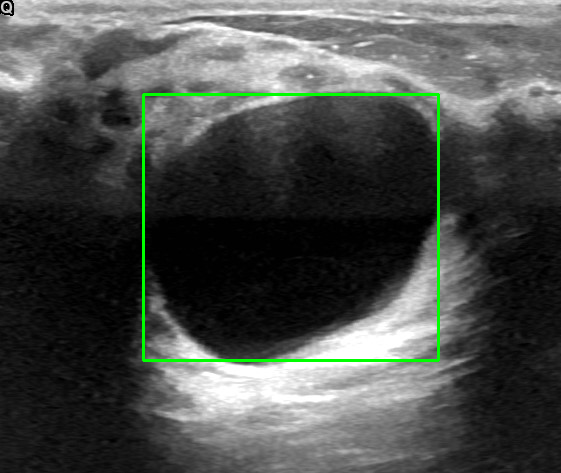

malignant [215.0, 19.0, 307.0, 86.0]


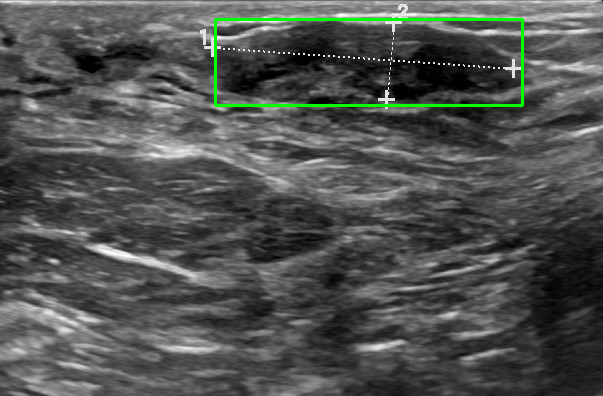

malignant [129.0, 218.0, 237.0, 144.0]


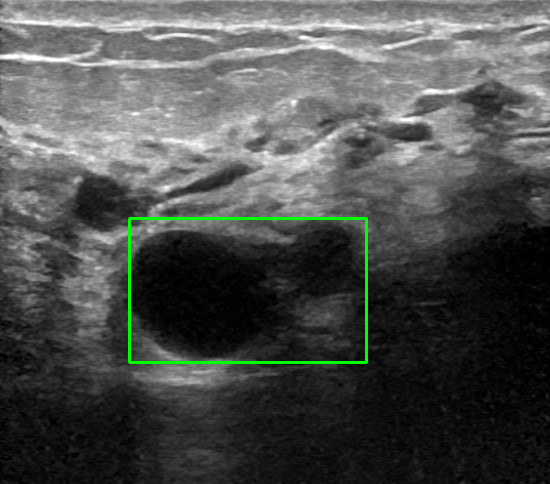

malignant [140.0, 23.0, 139.0, 89.0]


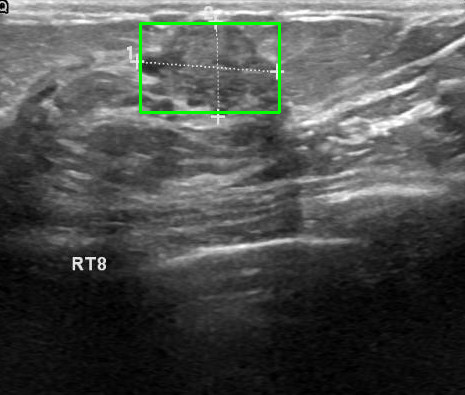

malignant [156.0, 108.0, 216.0, 117.0]


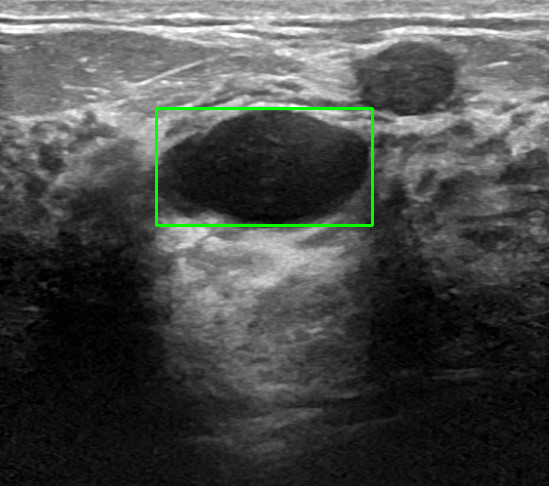

malignant [64.0, 178.0, 329.0, 260.0]


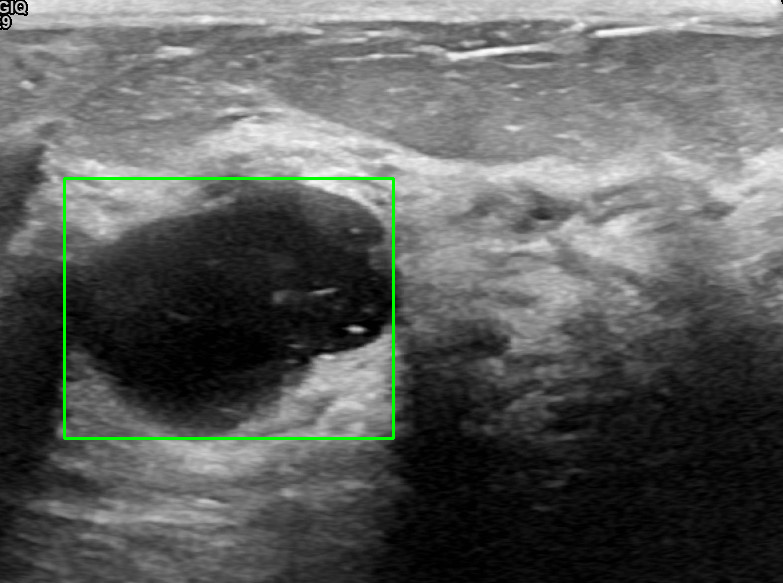

malignant [150.0, 102.0, 119.0, 73.0]


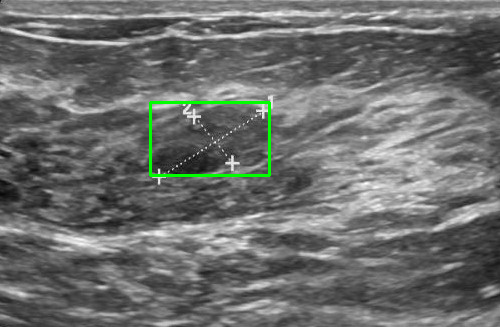

malignant [468.0, 73.0, 53.0, 35.0]


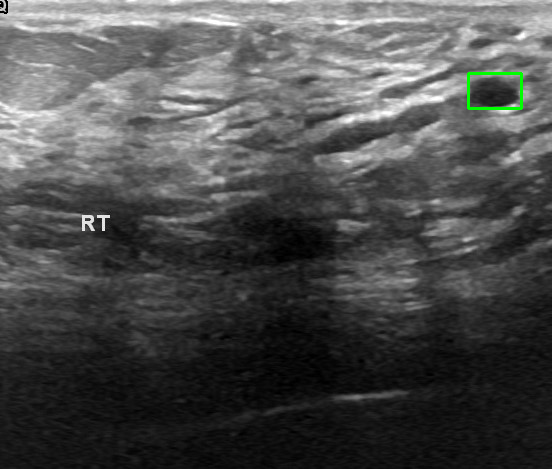

malignant [414.0, 158.0, 139.0, 89.0]


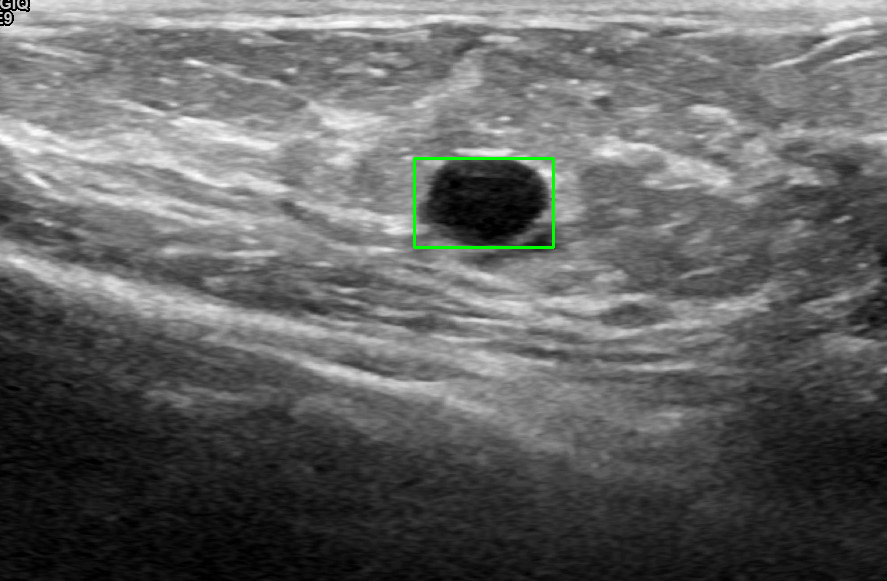

malignant [321.0, 58.0, 169.0, 106.0]


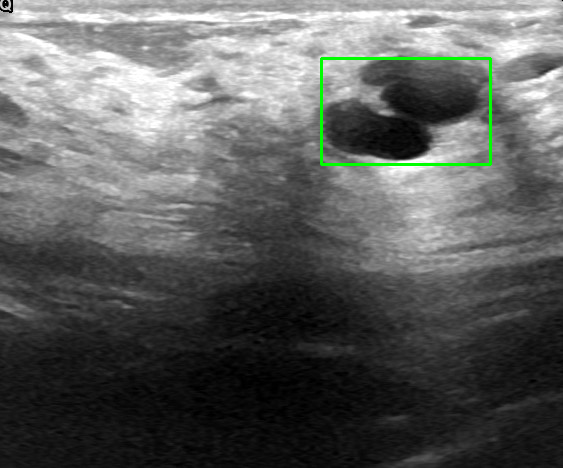

malignant [75.0, 30.0, 303.0, 41.0]


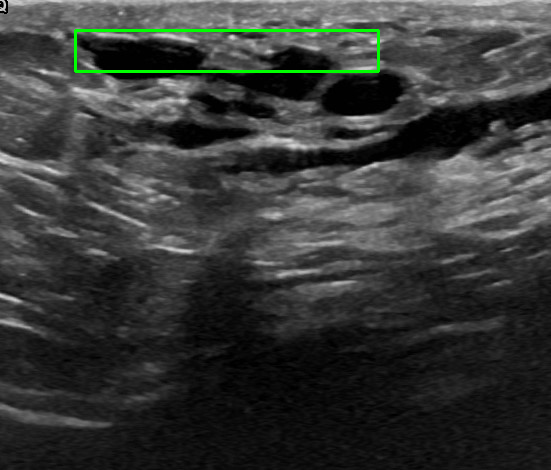

malignant [65.0, 20.0, 334.0, 138.0]


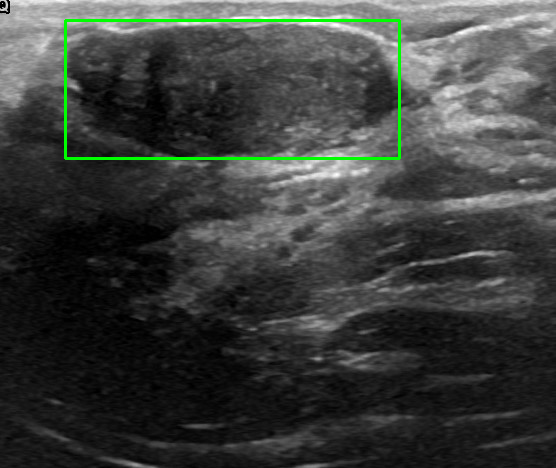

malignant [29.0, 19.0, 516.0, 235.0]


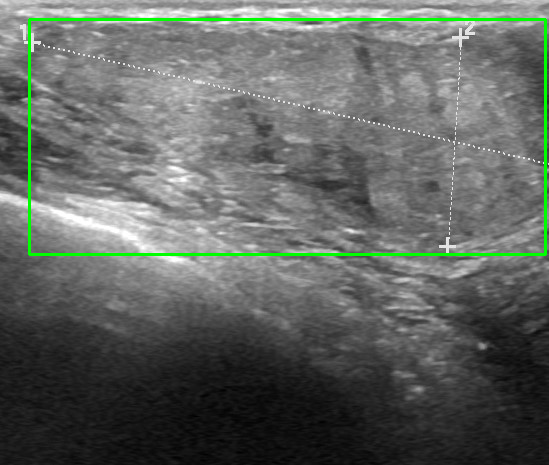

malignant [171.0, 94.0, 183.0, 51.0]


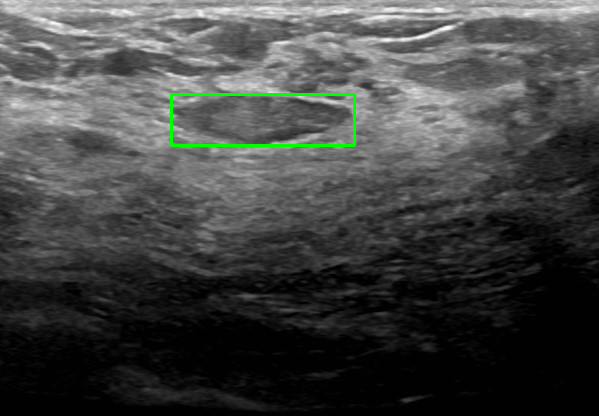

malignant [325.0, 225.0, 168.0, 63.0]


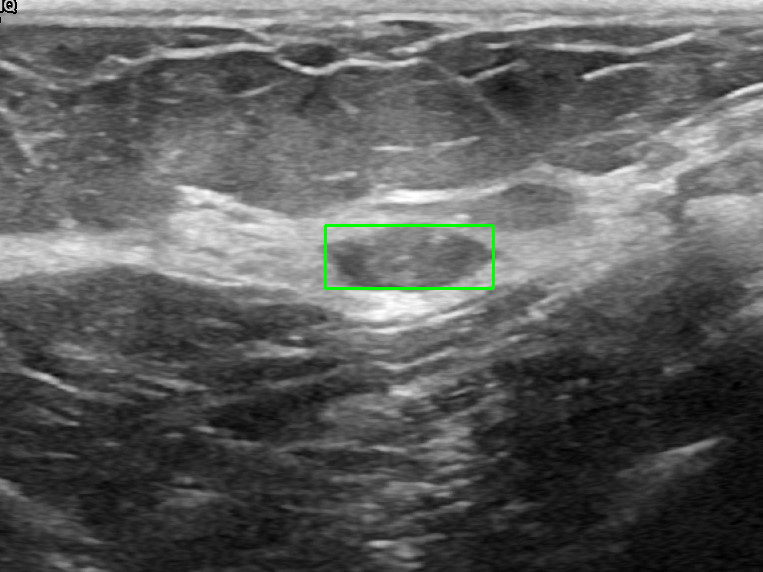

malignant [568.0, 116.0, 69.0, 41.0]


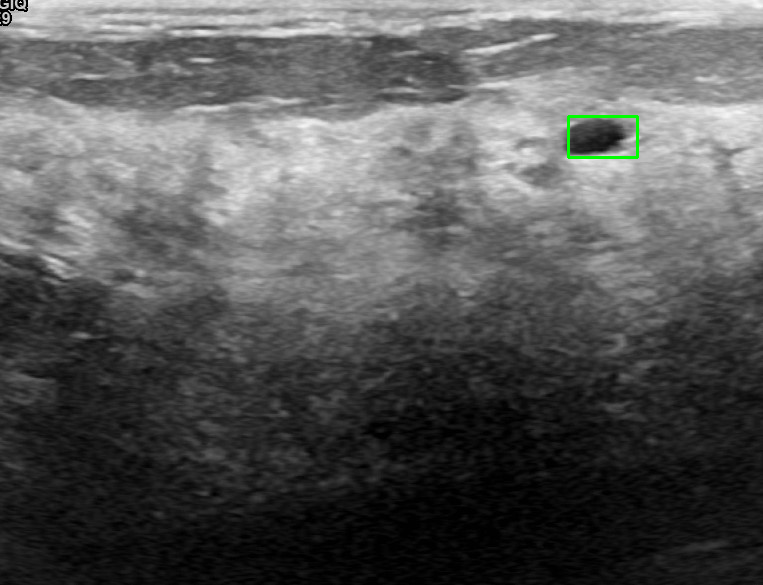

malignant [603.0, 60.0, 89.0, 54.0]


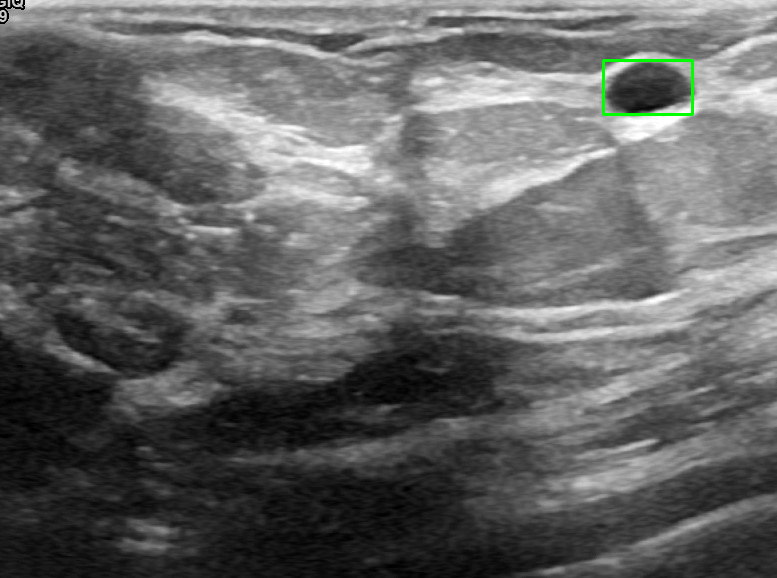

malignant [83.0, 99.0, 217.0, 85.0]


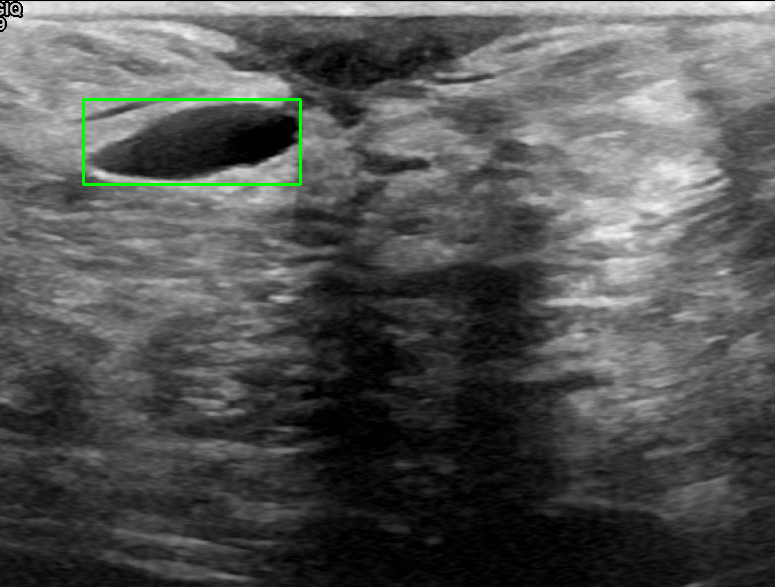

malignant [98.0, 15.0, 117.0, 48.0]


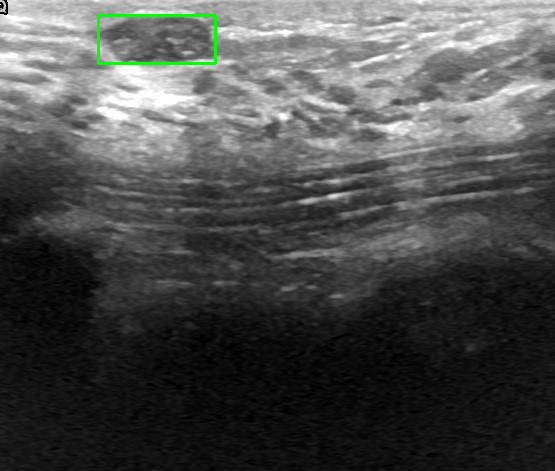

malignant [236.0, 52.0, 137.0, 80.0]


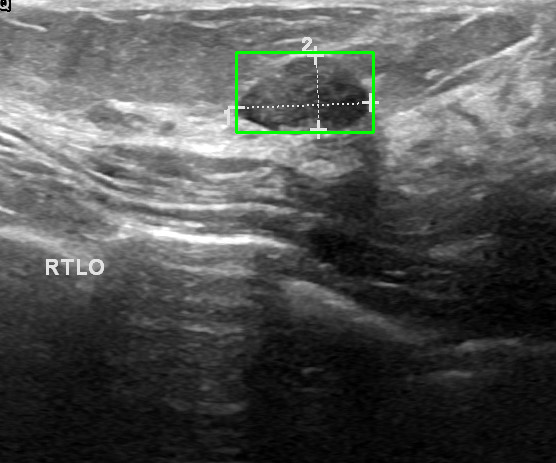

malignant [45.0, 99.0, 151.0, 24.0]


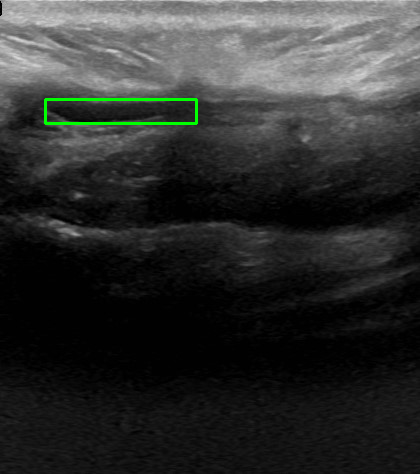

malignant [273.0, 195.0, 247.0, 115.0]


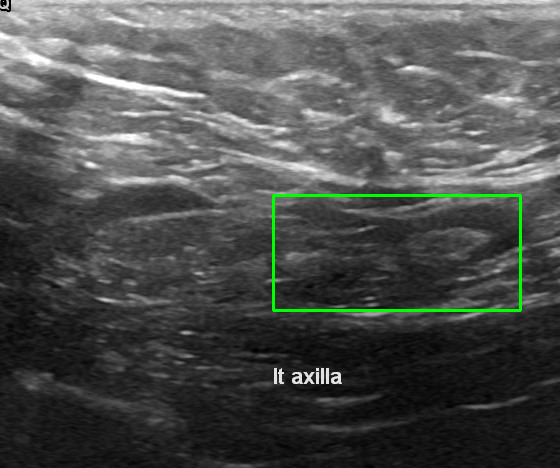

malignant [111.0, 18.0, 166.0, 64.0]


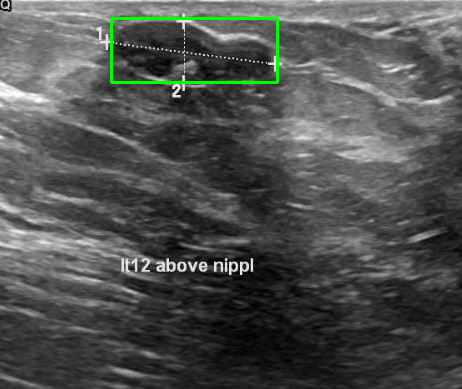

malignant [237.0, 134.0, 101.0, 70.0]


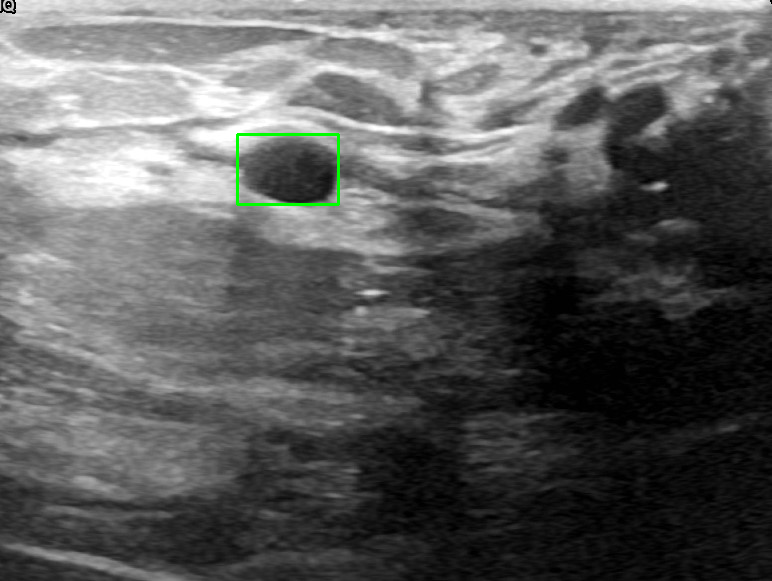

malignant [200.0, 102.0, 112.0, 42.0]


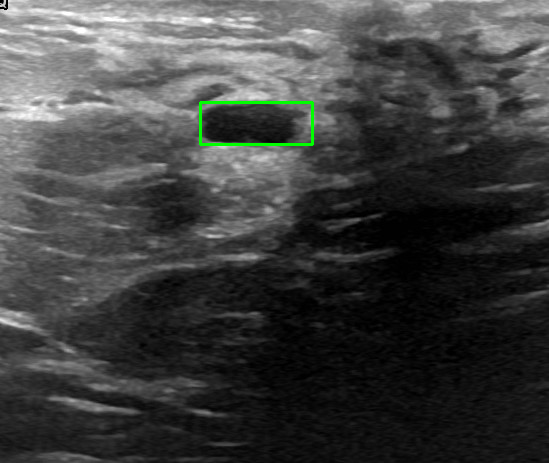

malignant [88.0, 98.0, 216.0, 73.0]


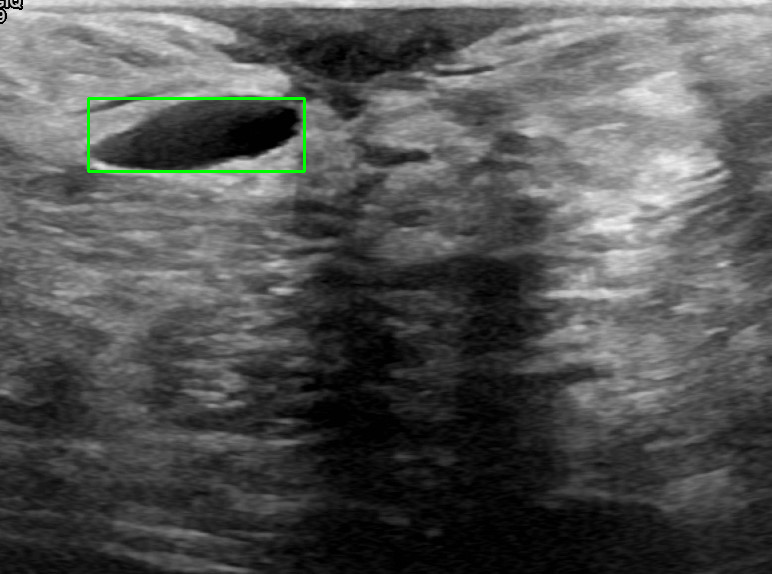

malignant [222.0, 190.0, 73.0, 59.0]


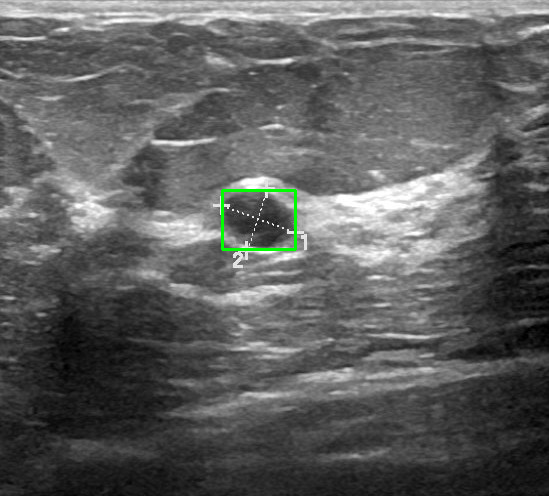

malignant [261.0, 126.0, 57.0, 31.0]


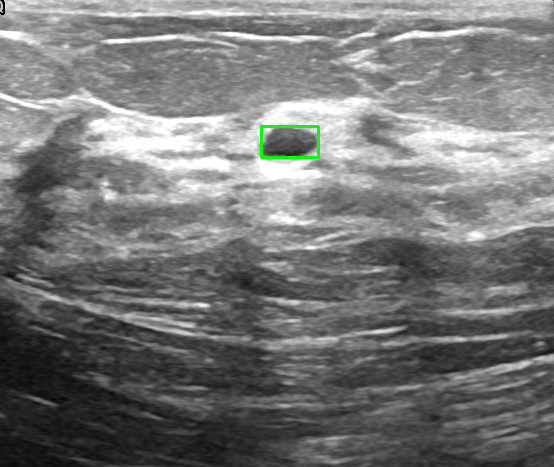

malignant [332.0, 182.0, 80.0, 39.0]


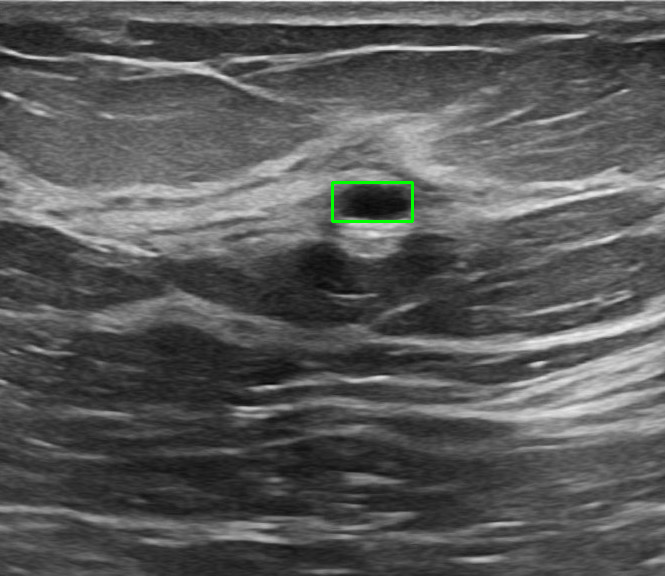

malignant [44.0, 44.0, 370.0, 129.0]


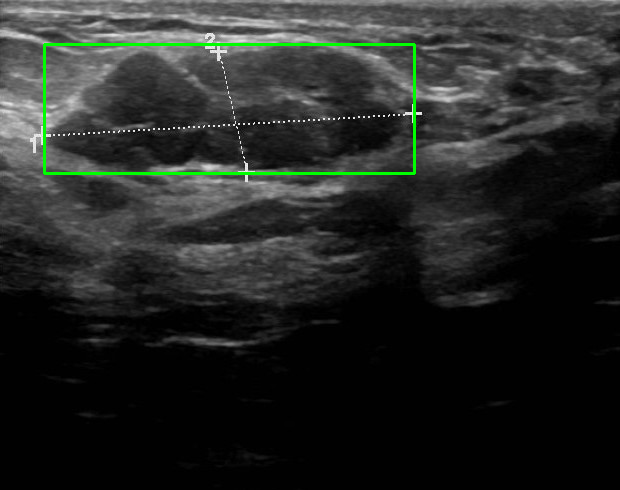

malignant [99.0, 129.0, 51.0, 32.0]


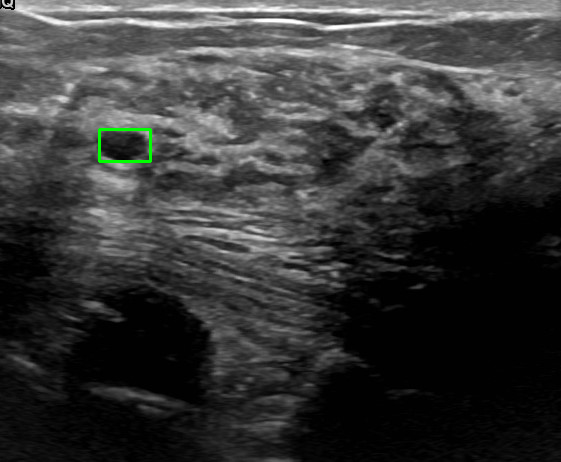

malignant [283.0, 66.0, 124.0, 66.0]


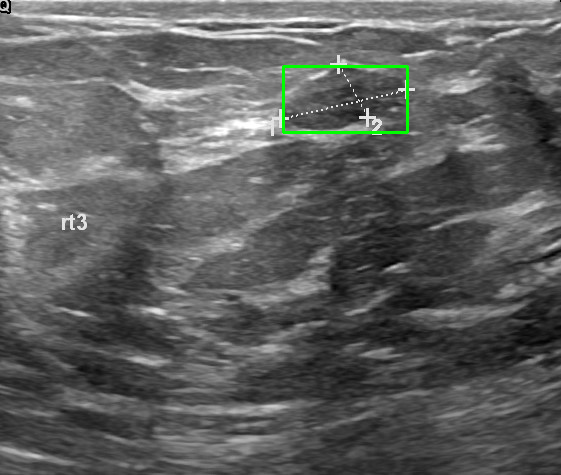

malignant [126.0, 191.0, 104.0, 74.0]


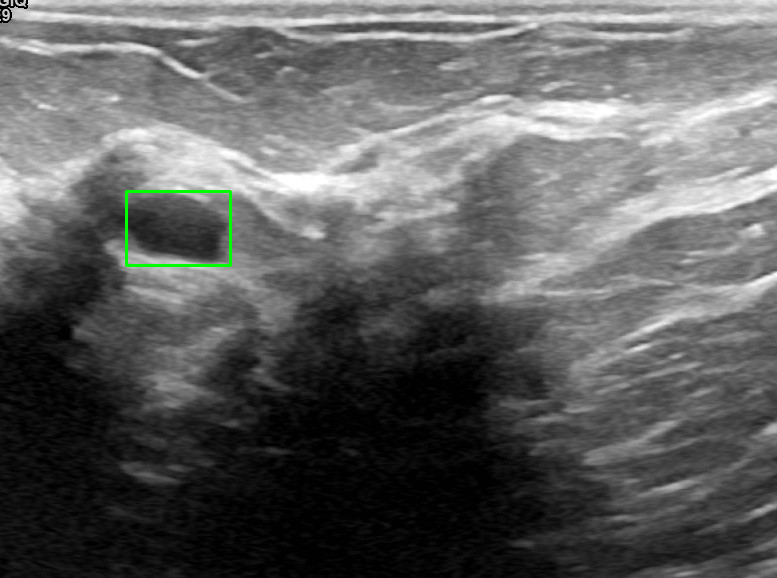

malignant [248.0, 100.0, 344.0, 224.0]


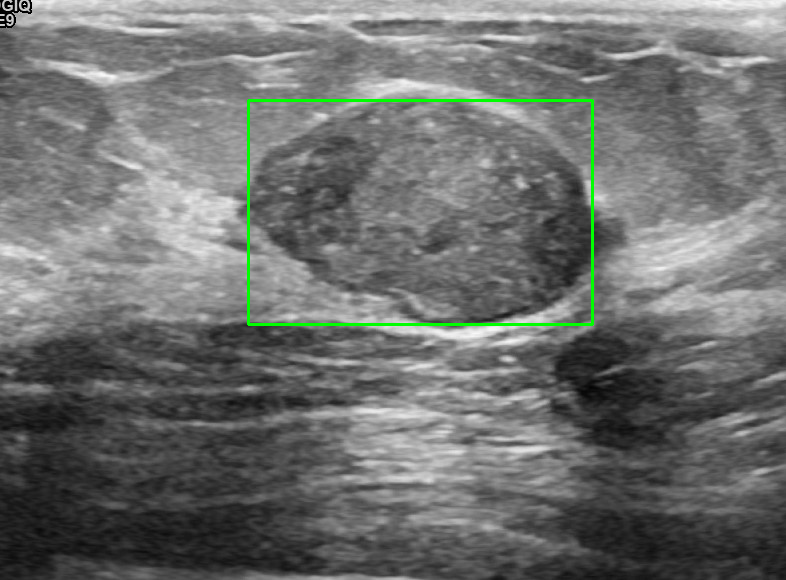

malignant [179.0, 158.0, 194.0, 61.0]


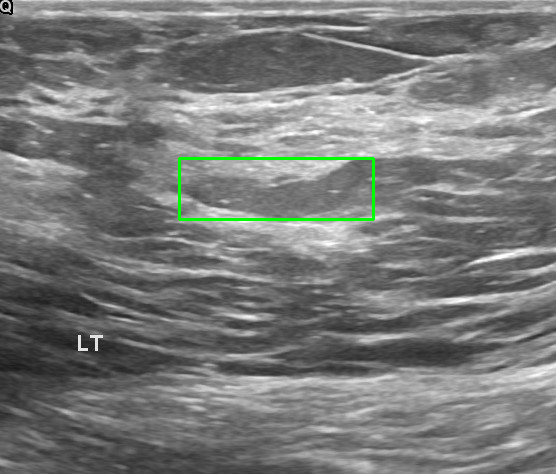

malignant [121.0, 148.0, 273.0, 103.0]


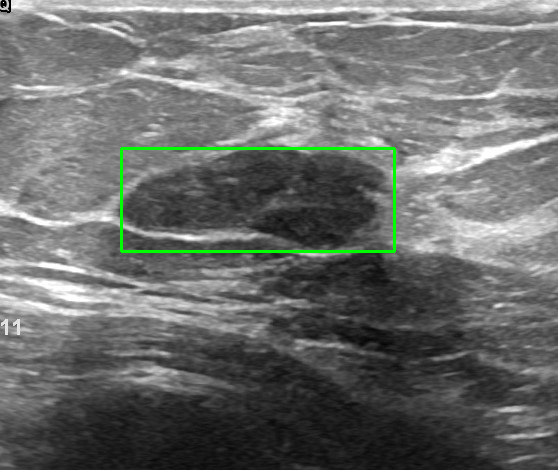

malignant [73.0, 156.0, 46.0, 33.0]


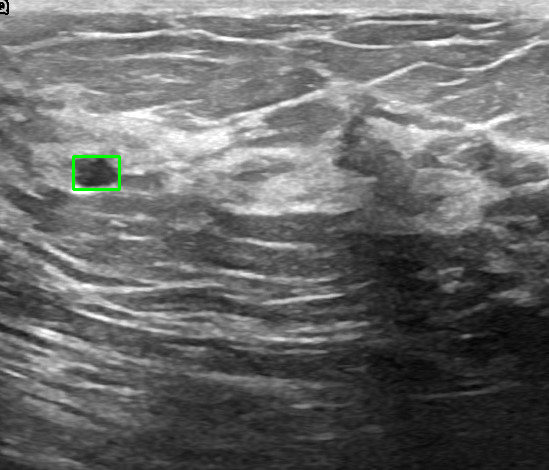

malignant [64.0, 103.0, 75.0, 50.0]


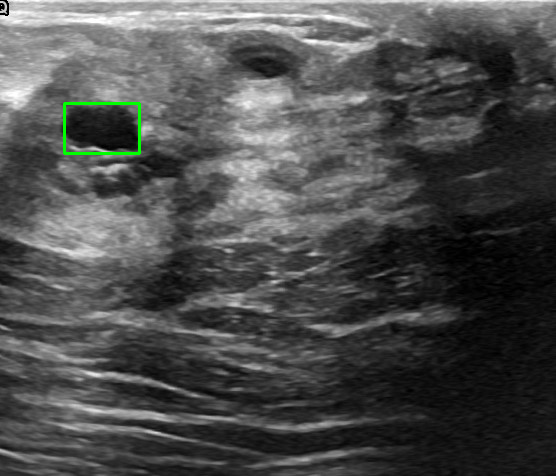

malignant [148.0, 118.0, 396.0, 105.0]


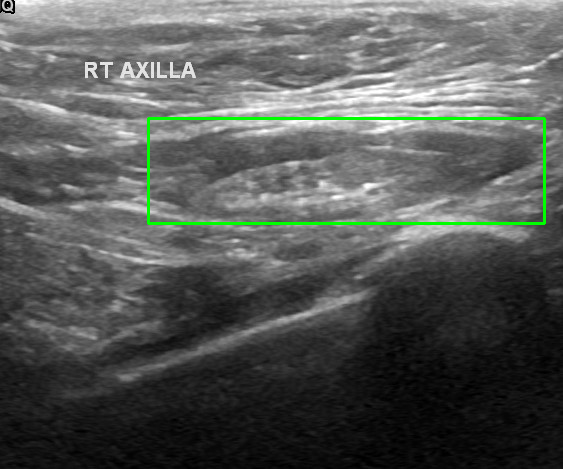

malignant [110.0, 97.0, 208.0, 154.0]


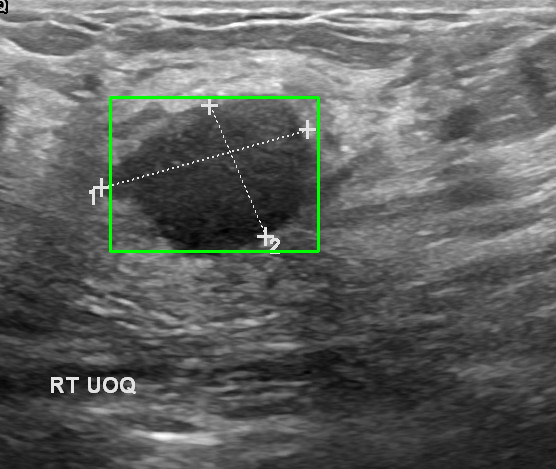

malignant [13.0, 58.0, 238.0, 169.0]


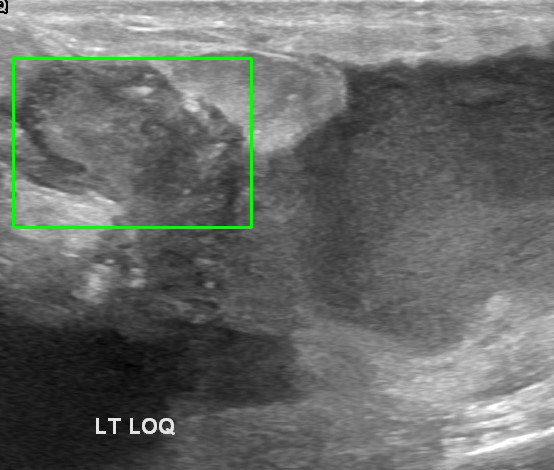

malignant [94.0, 105.0, 75.0, 68.0]


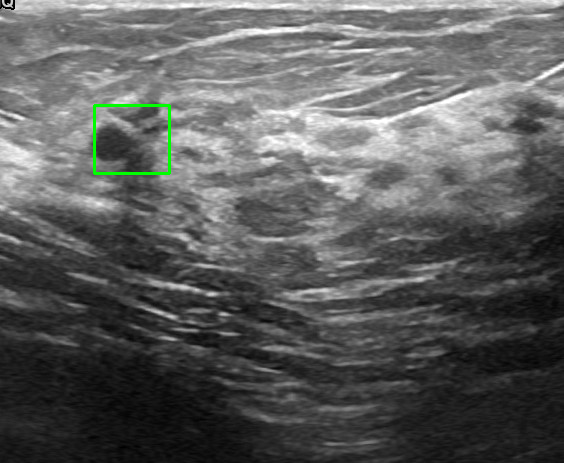

malignant [27.0, 157.0, 342.0, 188.0]


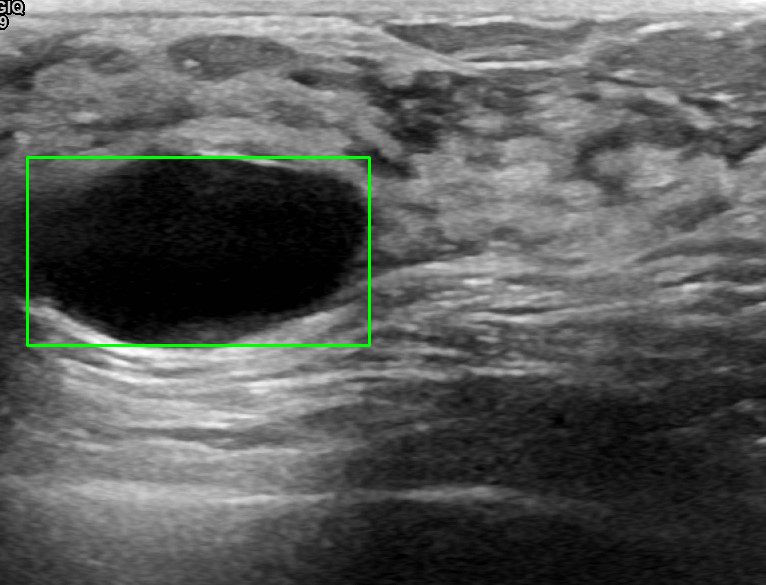

malignant [80.0, 55.0, 685.0, 410.0]


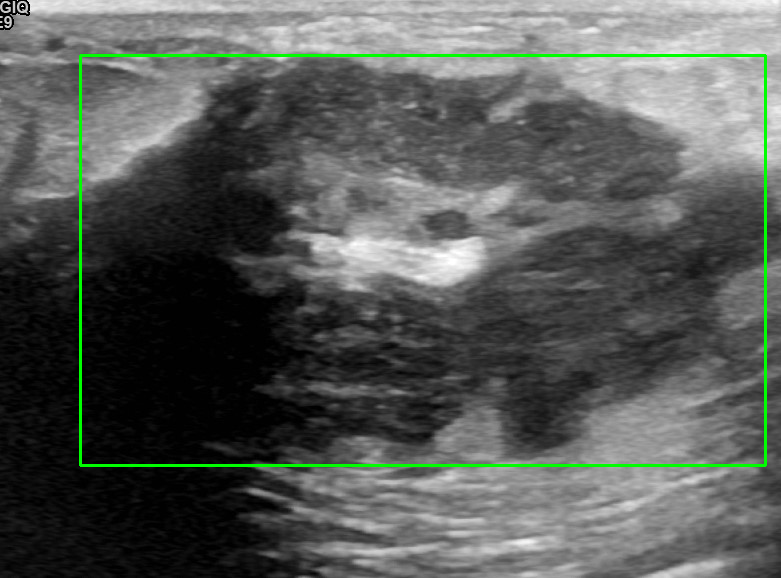

IndexError: ignored

In [ ]:
import cv2
import json
import os
from google.colab.patches import cv2_imshow

# Path to your COCO JSON file and the directory containing the images
coco_json_path = '/content/Dataset_BUSI_with_GT/test/coco.json'
image_directory = '/content/Dataset_BUSI_with_GT/test'

# Load the JSON file
with open(coco_json_path) as f:
    coco_data = json.load(f)

# Parse the JSON data
for annotation in coco_data['annotations']:
    image_id = annotation['image_id']
    category_id = annotation['category_id']

    bbox = annotation['bbox']  # bbox format: [x_min, y_min, width, height]

    # Find the corresponding image file
    image_info = next((img for img in coco_data['images'] if img['id'] == image_id), None)
    if image_info:
        image_path = os.path.join(image_directory, image_info['file_name'])
        image = cv2.imread(image_path)

        if image is not None:
            # Draw the bounding box
            x, y, w, h = map(int, bbox)
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

            # Display the image
            print(classes[int(category_id)], bbox)

            cv2_imshow(image)
            cv2.waitKey(0)  # Wait for a key press to show the next image
            cv2.destroyAllWindows()
        else:
            print(f"Image {image_info['file_name']} not found.")


In [ ]:
img_size = 500   # image size: 500 * 500
X_image, X_mask = load_data('/content/Dataset_BUSI_with_GT/*/*', img_size)
X_image.shape

(780, 500, 500)

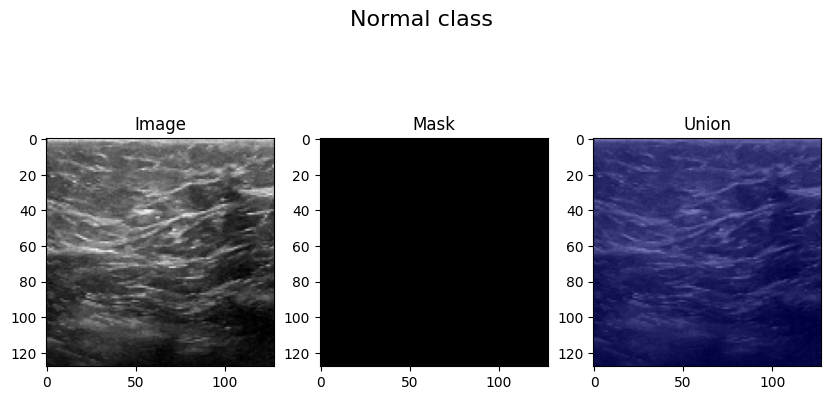

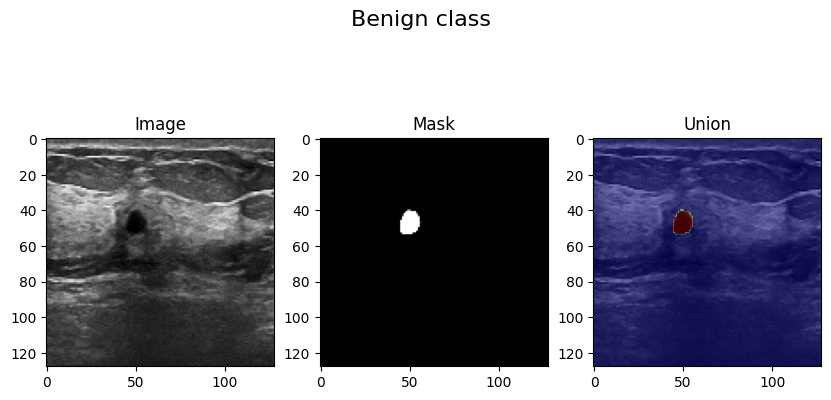

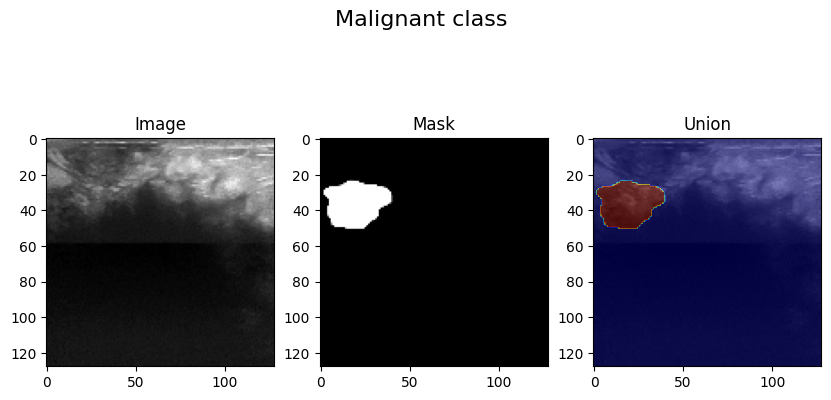

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(10,5))

i = np.random.randint(647,780)
ax[0].imshow(X_image[i], cmap='gray')
ax[0].set_title('Image')
ax[1].imshow(X_mask[i], cmap='gray')
ax[1].set_title('Mask')
ax[2].imshow(X_image[i], cmap='gray')
ax[2].imshow(tf.squeeze(X_mask[i]), alpha=0.5, cmap='jet')
ax[2].set_title('Union')
fig.suptitle('Normal class', fontsize=16)
plt.show()

fig, ax = plt.subplots(1,3, figsize=(10,5))

i = np.random.randint(437)
ax[0].imshow(X_image[i], cmap='gray')
ax[0].set_title('Image')
ax[1].imshow(X_mask[i], cmap='gray')
ax[1].set_title('Mask')
ax[2].imshow(X_image[i], cmap='gray')
ax[2].imshow(tf.squeeze(X_mask[i]), alpha=0.5, cmap='jet')
ax[2].set_title('Union')
fig.suptitle('Benign class', fontsize=16)
plt.show()

fig, ax = plt.subplots(1,3, figsize=(10,5))

i = np.random.randint(437,647)
ax[0].imshow(X_image[i], cmap='gray')
ax[0].set_title('Image')
ax[1].imshow(X_mask[i], cmap='gray')
ax[1].set_title('Mask')
ax[2].imshow(X_image[i], cmap='gray')
ax[2].imshow(tf.squeeze(X_mask[i]), alpha=0.5, cmap='jet')
ax[2].set_title('Union')
fig.suptitle('Malignant class', fontsize=16)
plt.show()

### Data Split and Augmentation

In [ ]:
X = np.array(list(zip(X_image, X_mask)))
X.shape

(780, 2, 500, 500)

In [ ]:
from sklearn.model_selection import train_test_split

# X[0:437] benign
# X[437:647] malignant
# X[647:780] normal
y = np.array([0]*437 + [1]*210 + [2]*133)

# add labels to ensure a stratified split, which maintains the proportion of each class across splits.
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)


In [ ]:
# convert splits into image and masks
X_train, mask_train = zip(*X_train)
X_train, mask_train = np.array(X_train), np.array(mask_train)
X_val, mask_val = zip(*X_val)
X_val, mask_val = np.array(X_val), np.array(mask_val)
X_test, mask_test = zip(*X_test)
X_test, mask_test = np.array(X_test), np.array(mask_test)

In [ ]:
# expand dims
X_train, mask_train = np.expand_dims(X_train, -1), np.expand_dims(mask_train, -1)
X_val, mask_val = np.expand_dims(X_val, -1), np.expand_dims(mask_val, -1)
X_test, mask_test = np.expand_dims(X_test, -1), np.expand_dims(mask_test, -1)

In [ ]:
print(X_train.shape, mask_train.shape, y_train.shape)
print(X_val.shape, mask_val.shape, y_val.shape)
print(X_test.shape, mask_test.shape, y_test.shape)

(624, 500, 500, 1) (624, 500, 500, 1) (624,)
(78, 500, 500, 1) (78, 500, 500, 1) (78,)
(78, 500, 500, 1) (78, 500, 500, 1) (78,)


In [ ]:
# data augmentation for training data
data_gen_args = dict(rotation_range=10,
                     width_shift_range=0.05,
                     height_shift_range=0.05,
                     shear_range=0.05,
                     zoom_range=0.05,
                     horizontal_flip=True,
                     fill_mode='nearest',)
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

In [ ]:
seed = 42
augment = True
def augment_data(X_data, M_data, labels, batch_size):

    # Create two separate generators for images and masks
    # same seed and shuffle settings helps to maintain the alignment between each image and its corresponding mask.
    image_gen = image_datagen.flow(X_data, labels, batch_size=batch_size, seed=seed, shuffle=True)
    mask_gen = mask_datagen.flow(M_data, labels, batch_size=batch_size, seed=seed, shuffle=True)

    while True:
        X1i, labels1 = image_gen.next()
        X2i, _ = mask_gen.next()
        yield X1i, X2i, labels1

In [ ]:
batch_size = 6
num_of_augmentations = 1872  # 3 times of the training data
augmented_images, augmented_masks, augmented_labels = [], [], []

# Create augmented data
augment_gen = augment_data(X_train, mask_train, y_train, batch_size)

for i in range(num_of_augmentations // batch_size):
    img_batch, mask_batch, label_batch = next(augment_gen)
    augmented_images.extend(img_batch)
    augmented_masks.extend(mask_batch)
    augmented_labels.extend(label_batch)

# Convert lists to numpy arrays
augmented_images = np.array(augmented_images)
augmented_masks = np.array(augmented_masks)
augmented_labels = np.array(augmented_labels)

In [ ]:
np.savez_compressed('val_data.npz', images=X_val, labels=y_val, masks=mask_val)
np.savez_compressed('test_data.npz', images=X_test, labels=y_test, masks=mask_test)

In [ ]:
# Save the augmented data
np.savez_compressed('train_data.npz', images=augmented_images, masks=augmented_masks, labels=augmented_labels)
print(augmented_images.shape, augmented_masks.shape, augmented_labels.shape)

(1872, 500, 500, 1) (1872, 500, 500, 1) (1872,)


### Load data

As part of our project, we have a total of 780 ultrasound images. The dataset was divided into training, validation, and testing sets with an 8:1:1 split, resulting in approximately 624 training images, and 78 images each for validation and testing. After applying data augmentation techniques to the training set, we have expanded it to 1824 samples.

Each image in our dataset, including augmented ones, has dimensions of 500 x 500 pixels. For guidance on how to load and utilize this data, please refer to the example provided below.

For classification tasks, we use the images (X_<dataset>), masks (masks_<dataset>), and labels (y_<dataset>). In contrast, for segmentation tasks, we primarily focus on the images and masks.

We have converted all images from RGB to grayscale, reducing the last dimension of our data from 3 (for RGB) to 1 (for grayscale). This decision was driven by two main factors: the limited RAM available in common Google Colab instances and the nature of ultrasound imaging. Ultrasou


In [ ]:
train_data, val_data, test_data = np.load('train_data.npz'), np.load('val_data.npz'), np.load('test_data.npz')

# get the image, mask and labels
X_train, masks_train, y_train = train_data['images'], train_data['masks'], train_data['labels']
X_val, masks_val, y_val = val_data['images'], val_data['masks'], val_data['labels']
X_test, masks_test, y_test = test_data['images'], test_data['masks'], test_data['labels']

In [ ]:
print(X_train.shape, masks_train.shape, y_train.shape)
print(X_val.shape, masks_val.shape, y_val.shape)
print(X_test.shape, masks_test.shape, y_test.shape)

(1872, 500, 500, 1) (1872, 500, 500, 1) (1872,)
(78, 500, 500, 1) (78, 500, 500, 1) (78,)
(78, 500, 500, 1) (78, 500, 500, 1) (78,)


## Mask RCNN

In [ ]:
!rm -rf /content/Dataset_BUSI_with_GT/train/mask
!rm -rf /content/Dataset_BUSI_with_GT/test/mask
!rm -rf /content/Dataset_BUSI_with_GT/valid/mask
!mv /content/Dataset_BUSI_with_GT/train/coco.json /content/train_coco.json
!mv /content/Dataset_BUSI_with_GT/test/coco.json /content/test_coco.json
!mv /content/Dataset_BUSI_with_GT/valid/coco.json /content/valid_coco.json

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-z6jl9v40
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-z6jl9v40
  Resolved https://github.com/facebookresearch/detectron2.git to commit a0e22dbfa791e6235e4f196d5ce25e754d02be31
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 16.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6121728 sha256=24bdc5b7bdb4720470c368c25db49

In [ ]:
import os
import detectron2
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# Paths to your train, validation, test data and COCO JSON files
train_data_path = "/content/Dataset_BUSI_with_GT/train"
train_json_path = "/content/train_coco.json"

valid_data_path = "/content/Dataset_BUSI_with_GT/valid"
valid_json_path = "/content/valid_coco.json"

test_data_path = "/content/Dataset_BUSI_with_GT/test"
test_json_path = "/content/test_coco.json"

# Registering datasets in Detectron2
register_coco_instances("BUSI_train", {}, train_json_path, train_data_path)
register_coco_instances("BUSI_val", {}, valid_json_path, valid_data_path)
register_coco_instances("BUSI_test", {}, test_json_path, test_data_path)

In [ ]:
# Configuration setup
from detectron2.data import transforms as T
cfg = get_cfg()

# Select model and load pretrained weights
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

# Set dataset-specific parameters
cfg.DATASETS.TRAIN = ("BUSI_train",)
cfg.DATASETS.TEST = ("BUSI_val",)
cfg.DATALOADER.NUM_WORKERS = 8

# Set training hyperparameters
cfg.INPUT.AUGMENTATIONS = [
    T.ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice'),
    T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
    T.RandomBrightness(0.8, 1.2),
    T.RandomContrast(0.8, 1.2),
    T.RandomSaturation(0.8, 1.2)
]
cfg.SOLVER.IMS_PER_BATCH = 2  #
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.WEIGHT_DECAY = 0.0001  # L2 regularization
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.OUTPUT_DIR = "/content/output"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[12/08 15:55:46 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

R-50.pkl: 102MB [00:00, 201MB/s]                           

[12/08 15:55:47 d2.checkpoint.c2_model_loading]: Renaming Caffe2 weights ......


[12/08 15:55:47 d2.checkpoint.c2_model_loading]: Following weights matched with submodule backbone.bottom_up - Total num: 54


backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.deconv.{bias, weight}
roi_heads.mask_head.mask_fcn1.{bias, weight}
roi_heads.mask_head.mask_fcn2.{bias, weight}
roi_heads.mask_head.mask_fcn3.{bias, weight}
roi_heads.mask_head.mask_fcn4.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}
  fc1000.{bias, weight}
  stem.conv1.bias


[12/08 15:55:47 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/08 15:55:56 d2.utils.events]:  eta: 0:03:24  iter: 19  total_loss: 3.17  loss_cls: 1.75  loss_box_reg: 0.001058  loss_mask: 0.6884  loss_rpn_cls: 0.7123  loss_rpn_loc: 0.008507    time: 0.2113  last_time: 0.1959  data_time: 0.0202  last_data_time: 0.0046   lr: 4.9953e-06  max_mem: 2512M
[12/08 15:55:59 d2.utils.events]:  eta: 0:03:11  iter: 39  total_loss: 2.205  loss_cls: 0.8063  loss_box_reg: 0.0008783  loss_mask: 0.6868  loss_rpn_cls: 0.7031  loss_rpn_loc: 0.007917    time: 0.2002  last_time: 0.1784  data_time: 0.0050  last_data_time: 0.0048   lr: 9.9902e-06  max_mem: 2512M
[12/08 15:56:03 d2.utils.events]:  eta: 0:03:02  iter: 59  total_loss: 1.594  loss_cls: 0.2087  loss_box_reg: 0.0007412  loss_mask: 0.6734  loss_rpn_cls: 0.6803  loss_rpn_loc: 0.008469    time: 0.1950  last_time: 0.2240  data_time: 0.0045  last_data_time: 0.0034   lr: 1.4985e-05  max_mem: 2576M
[12/08 15:56:07 d2.utils.events]:  eta: 0:02:58  iter: 79  total_loss: 1.448  loss_cls: 0.09541  loss_box_reg: 0.024

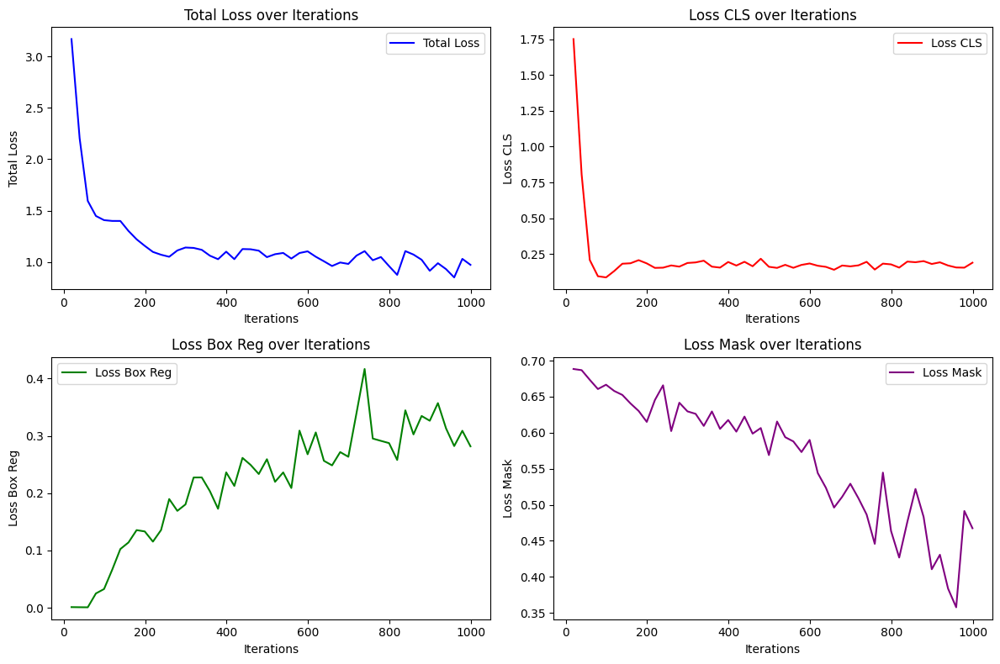

In [ ]:
import json
import matplotlib.pyplot as plt

# Path to your JSON log file
log_file_path = '/content/output/metrics.json'

# Initialize lists to store the parsed data and iterations
iterations = []
total_loss = []
loss_cls = []
loss_box_reg = []
loss_mask = []

with open(log_file_path, 'r') as file:
    for line in file:
        # Convert JSON string to Python dictionary
        log_entry = json.loads(line.strip())

        # Append the iteration number and the loss values
        iterations.append(log_entry.get("iteration", None))
        total_loss.append(log_entry.get("total_loss", None))
        loss_cls.append(log_entry.get("loss_cls", None))
        loss_box_reg.append(log_entry.get("loss_box_reg", None))
        loss_mask.append(log_entry.get("loss_mask", None))

# Plotting the data
plt.figure(figsize=(12, 8))

# Plotting Total Loss
plt.subplot(2, 2, 1)
plt.plot(iterations, total_loss, label='Total Loss', color='blue')
plt.xlabel('Iterations')
plt.ylabel('Total Loss')
plt.title('Total Loss over Iterations')
plt.legend()

# Plotting Loss CLS
plt.subplot(2, 2, 2)
plt.plot(iterations, loss_cls, label='Loss CLS', color='red')
plt.xlabel('Iterations')
plt.ylabel('Loss CLS')
plt.title('Loss CLS over Iterations')
plt.legend()

# Plotting Loss Box Reg
plt.subplot(2, 2, 3)
plt.plot(iterations, loss_box_reg, label='Loss Box Reg', color='green')
plt.xlabel('Iterations')
plt.ylabel('Loss Box Reg')
plt.title('Loss Box Reg over Iterations')
plt.legend()

# Plotting Loss Mask
plt.subplot(2, 2, 4)
plt.plot(iterations, loss_mask, label='Loss Mask', color='purple')
plt.xlabel('Iterations')
plt.ylabel('Loss Mask')
plt.title('Loss Mask over Iterations')
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()



### Evaluation

In [ ]:
from detectron2.engine import DefaultPredictor

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to the model weights
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set a threshold for this model
predictor = DefaultPredictor(cfg)


[12/08 18:03:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/output/model_final.pth ...


In [ ]:
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

os.makedirs("/content/output/test", exist_ok=True)
evaluator = COCOEvaluator("BUSI_test", cfg, False, output_dir="/content/output/test")
val_loader = build_detection_test_loader(cfg, "BUSI_test")
inference_on_dataset(predictor.model, val_loader, evaluator)


WARNING [12/08 18:03:51 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[12/08 18:03:51 d2.data.datasets.coco]: Loaded 78 images in COCO format from /content/test_coco.json
[12/08 18:03:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/08 18:03:51 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/08 18:03:51 d2.data.common]: Serializing 78 elements to byte tensors and concatenating them all ...
[12/08 18:03:51 d2.data.common]: Serialized dataset takes 0.20 MiB
[12/08 18:03:51 d2.evaluation.evaluator]: Start inference on 78 batches
[12/08 18:03:53 d2.evaluation.evaluator]: Inference done 11/78. Dataloading: 0.0009 s/iter. Inference: 0.1083 s/iter. Eval: 0.0042 s/iter. Total: 0.1133 s/iter. ETA=0:00:07
[12/08 18:03:58 

OrderedDict([('bbox',
              {'AP': 16.64062015767839,
               'AP50': 46.29106224212109,
               'AP75': 6.009437787603916,
               'APs': 0.0,
               'APm': 8.317623658872517,
               'APl': 20.092939250488186,
               'AP-normal': nan,
               'AP-benign': 17.35249636891171,
               'AP-malignant': 15.928743946445081}),
             ('segm',
              {'AP': 17.861315120063647,
               'AP50': 48.06864433960208,
               'AP75': 2.7198137599822814,
               'APs': 0.0,
               'APm': 8.872189177735864,
               'APl': 23.15676348112473,
               'AP-normal': nan,
               'AP-benign': 20.099237245303758,
               'AP-malignant': 15.62339299482354})])

In [ ]:
raw_data = evaluator._results
raw_data

OrderedDict([('bbox',
              {'AP': 16.64062015767839,
               'AP50': 46.29106224212109,
               'AP75': 6.009437787603916,
               'APs': 0.0,
               'APm': 8.317623658872517,
               'APl': 20.092939250488186,
               'AP-normal': nan,
               'AP-benign': 17.35249636891171,
               'AP-malignant': 15.928743946445081}),
             ('segm',
              {'AP': 17.861315120063647,
               'AP50': 48.06864433960208,
               'AP75': 2.7198137599822814,
               'APs': 0.0,
               'APm': 8.872189177735864,
               'APl': 23.15676348112473,
               'AP-normal': nan,
               'AP-benign': 20.099237245303758,
               'AP-malignant': 15.62339299482354})])

In [ ]:
import os
import random
import cv2

test_image_dir = '/content/Dataset_BUSI_with_GT/test'  # Update with your test image directory
test_images = os.listdir(test_image_dir)
selected_images = random.sample(test_images, 3)  # Select 3 random images for visualization

predictions = []
for img_name in selected_images:
    img_path = os.path.join(test_image_dir, img_name)
    img = cv2.imread(img_path)
    outputs = predictor(img)
    predictions.append((img, outputs))



7 tensor([0.8390, 0.6620, 0.6520, 0.5805, 0.5763, 0.5472, 0.5434])


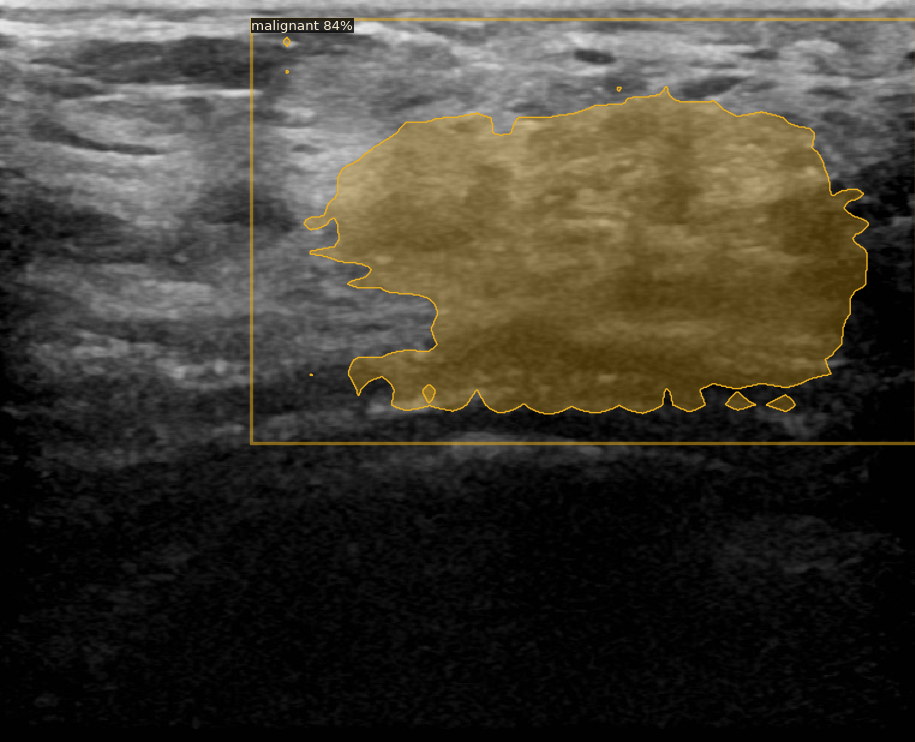

4 tensor([0.8893, 0.8204, 0.8038, 0.7147])


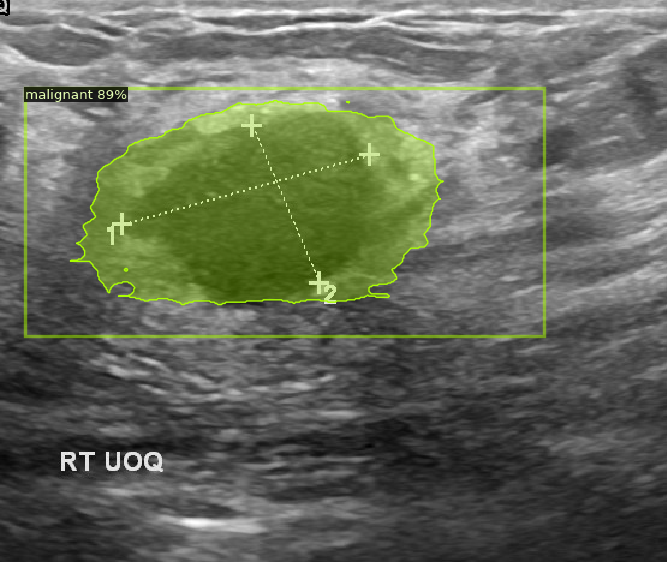

3 tensor([0.6049, 0.6035, 0.5136])


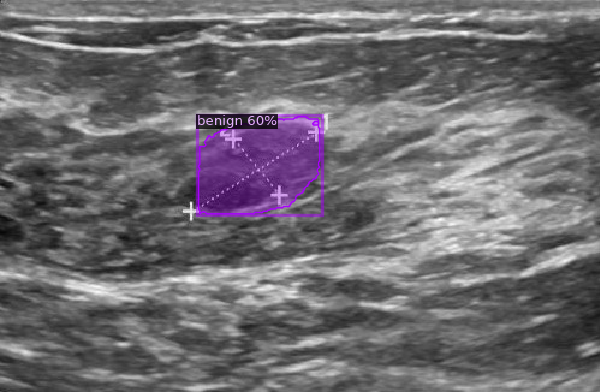

In [ ]:
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
from google.colab.patches import cv2_imshow

for img, output in predictions:
    # Create a visualizer instance
    instances = output["instances"].to("cpu")
    print(len(instances), instances.scores)

    if len(instances) > 0:
        # Filter to keep only the instance with the highest score
        max_score_index = instances.scores.argmax().item()

        top_instance = instances[max_score_index]

        v = Visualizer(img[:, :, ::-1],
                      metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]),
                      scale=1.2,
                      instance_mode=ColorMode.IMAGE_BW)

        # Visualize the predictions
        v = v.draw_instance_predictions(top_instance)
        visualized_img = v.get_image()[:, :, ::-1]

    # Display the image
    cv2_imshow(visualized_img)
    cv2.waitKey(0)


## Faster RCNN

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

# Configuration setup
faster_cfg = get_cfg()

# Select model and load pretrained weights for Faster R-CNN
faster_cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
# faster_cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

# Set dataset-specific parameters
faster_cfg.DATASETS.TRAIN = ("BUSI_train",)
faster_cfg.DATASETS.TEST = ("BUSI_val",)
faster_cfg.DATALOADER.NUM_WORKERS = 8

# Set training hyperparameters (same as before)
faster_cfg.INPUT.AUGMENTATIONS = [
    T.ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice'),
    T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
    T.RandomBrightness(0.8, 1.2),
    T.RandomContrast(0.8, 1.2),
    T.RandomSaturation(0.8, 1.2)
]
faster_cfg.SOLVER.IMS_PER_BATCH = 2
faster_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # Set the number of classes
faster_cfg.SOLVER.BASE_LR = 0.00025
faster_cfg.SOLVER.WEIGHT_DECAY = 0.0001
faster_cfg.SOLVER.MAX_ITER = 1000
faster_cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
faster_cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
faster_cfg.OUTPUT_DIR = "/content/faster_output"

os.makedirs(faster_cfg.OUTPUT_DIR, exist_ok=True)

# Initialize the trainer and start training
trainer = DefaultTrainer(faster_cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[12/08 16:19:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

backbone.fpn_lateral2.{bias, weight}
backbone.fpn_lateral3.{bias, weight}
backbone.fpn_lateral4.{bias, weight}
backbone.fpn_lateral5.{bias, weight}
backbone.fpn_output2.{bias, weight}
backbone.fpn_output3.{bias, weight}
backbone.fpn_output4.{bias, weight}
backbone.fpn_output5.{bias, weight}
proposal_generator.rpn_head.anchor_deltas.{bias, weight}
proposal_generator.rpn_head.conv.{bias, weight}
proposal_generator.rpn_head.objectness_logits.{bias, weight}
roi_heads.box_head.fc1.{bias, weight}
roi_heads.box_head.fc2.{bias, weight}
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  fc1000.{bias, weight}
  stem.conv1.bias


[12/08 16:19:17 d2.engine.train_loop]: Starting training from iteration 0
[12/08 16:19:22 d2.utils.events]:  eta: 0:03:47  iter: 19  total_loss: 1.883  loss_cls: 1.152  loss_box_reg: 0.001372  loss_rpn_cls: 0.6815  loss_rpn_loc: 0.007653    time: 0.2338  last_time: 0.2322  data_time: 0.0279  last_data_time: 0.0063   lr: 4.9953e-06  max_mem: 2670M
[12/08 16:19:27 d2.utils.events]:  eta: 0:03:48  iter: 39  total_loss: 1.242  loss_cls: 0.5395  loss_box_reg: 0.001206  loss_rpn_cls: 0.6749  loss_rpn_loc: 0.009038    time: 0.2403  last_time: 0.2415  data_time: 0.0047  last_data_time: 0.0038   lr: 9.9902e-06  max_mem: 2808M
[12/08 16:19:32 d2.utils.events]:  eta: 0:03:45  iter: 59  total_loss: 0.8721  loss_cls: 0.1933  loss_box_reg: 0.001501  loss_rpn_cls: 0.6558  loss_rpn_loc: 0.007461    time: 0.2420  last_time: 0.2434  data_time: 0.0046  last_data_time: 0.0042   lr: 1.4985e-05  max_mem: 2808M
[12/08 16:19:37 d2.utils.events]:  eta: 0:03:42  iter: 79  total_loss: 0.7974  loss_cls: 0.1468  l

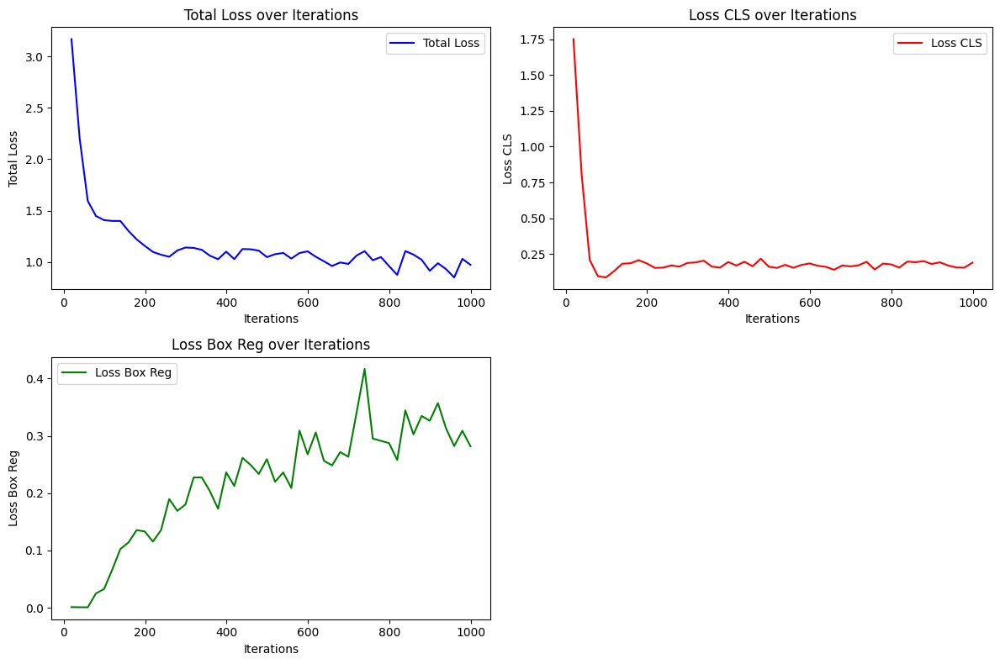

In [ ]:
import json
import matplotlib.pyplot as plt

# Path to your JSON log file
log_file_path = '/content/faster_output/metrics.json'

# Initialize lists to store the parsed data and iterations
iterations = []
total_loss = []
loss_cls = []
loss_box_reg = []
loss_mask = []

with open(log_file_path, 'r') as file:
    for line in file:
        # Convert JSON string to Python dictionary
        log_entry = json.loads(line.strip())

        # Append the iteration number and the loss values
        iterations.append(log_entry.get("iteration", None))
        total_loss.append(log_entry.get("total_loss", None))
        loss_cls.append(log_entry.get("loss_cls", None))
        loss_box_reg.append(log_entry.get("loss_box_reg", None))

# Plotting the data
plt.figure(figsize=(12, 8))

# Plotting Total Loss
plt.subplot(2, 2, 1)
plt.plot(iterations, total_loss, label='Total Loss', color='blue')
plt.xlabel('Iterations')
plt.ylabel('Total Loss')
plt.title('Total Loss over Iterations')
plt.legend()

# Plotting Loss CLS
plt.subplot(2, 2, 2)
plt.plot(iterations, loss_cls, label='Loss CLS', color='red')
plt.xlabel('Iterations')
plt.ylabel('Loss CLS')
plt.title('Loss CLS over Iterations')
plt.legend()

# Plotting Loss Box Reg
plt.subplot(2, 2, 3)
plt.plot(iterations, loss_box_reg, label='Loss Box Reg', color='green')
plt.xlabel('Iterations')
plt.ylabel('Loss Box Reg')
plt.title('Loss Box Reg over Iterations')
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()



### Evaluation

In [ ]:
from detectron2.engine import DefaultPredictor

faster_cfg.MODEL.WEIGHTS = os.path.join(faster_cfg.OUTPUT_DIR, "model_final.pth")  # Path to the model weights
faster_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set a threshold for this model
predictor = DefaultPredictor(faster_cfg)

[12/08 16:24:09 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/faster_output/model_final.pth ...


In [ ]:
os.makedirs("/content/output/test", exist_ok=True)
evaluator = COCOEvaluator("BUSI_test", faster_cfg, False, output_dir="/content/faster_output/test")
val_loader = build_detection_test_loader(faster_cfg, "BUSI_test")
inference_on_dataset(predictor.model, val_loader, evaluator)

WARNING [12/08 16:24:09 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[12/08 16:24:09 d2.data.datasets.coco]: Loaded 78 images in COCO format from /content/test_coco.json
[12/08 16:24:09 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/08 16:24:09 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/08 16:24:09 d2.data.common]: Serializing 78 elements to byte tensors and concatenating them all ...
[12/08 16:24:09 d2.data.common]: Serialized dataset takes 0.20 MiB
[12/08 16:24:09 d2.evaluation.evaluator]: Start inference on 78 batches
[12/08 16:24:11 d2.evaluation.evaluator]: Inference done 11/78. Dataloading: 0.0013 s/iter. Inference: 0.0982 s/iter. Eval: 0.0002 s/iter. Total: 0.0997 s/iter. ETA=0:00:06
[12/08 16:24:16 

OrderedDict([('bbox',
              {'AP': 11.487856979782194,
               'AP50': 35.97541147113433,
               'AP75': 3.4585152633502094,
               'APs': 0.0,
               'APm': 6.812854419587272,
               'APl': 14.714533708385119,
               'AP-normal': nan,
               'AP-benign': 13.109209209541875,
               'AP-malignant': 9.866504750022514})])

In [ ]:
raw_data = evaluator._results

In [ ]:
test_image_dir = '/content/Dataset_BUSI_with_GT/test'  # Update with your test image directory
test_images = os.listdir(test_image_dir)
selected_images = random.sample(test_images, 3)  # Select 3 random images for visualization

predictions = []
for img_name in selected_images:
    img_path = os.path.join(test_image_dir, img_name)
    img = cv2.imread(img_path)
    outputs = predictor(img)
    predictions.append((img, outputs))

2 tensor([0.9731, 0.7779])


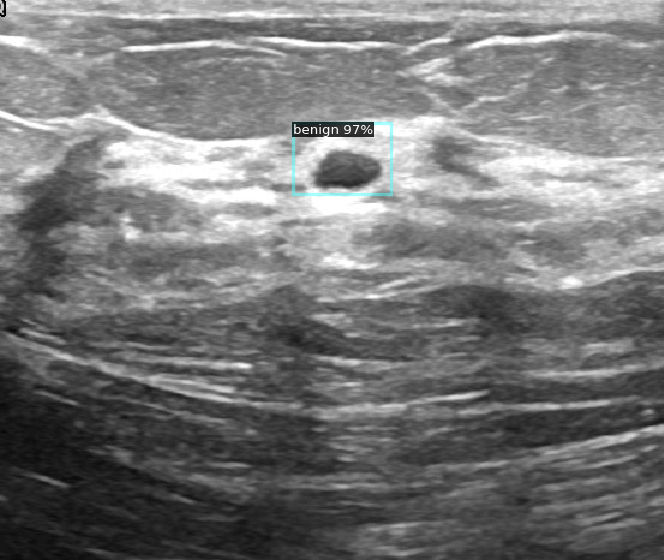

7 tensor([0.7544, 0.7498, 0.5835, 0.5832, 0.5795, 0.5631, 0.5426])


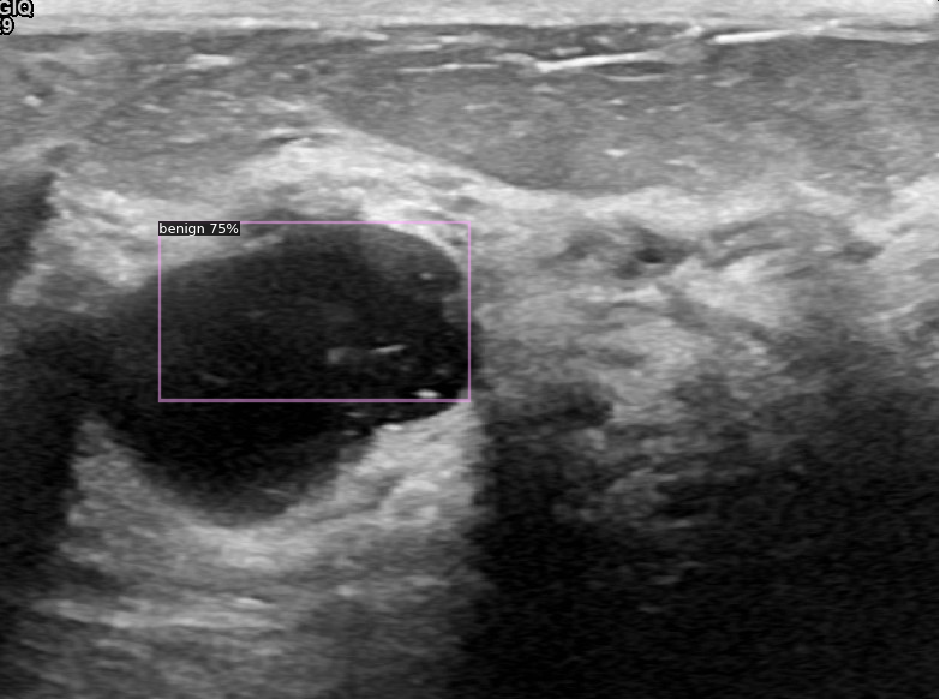

2 tensor([0.5531, 0.5487])


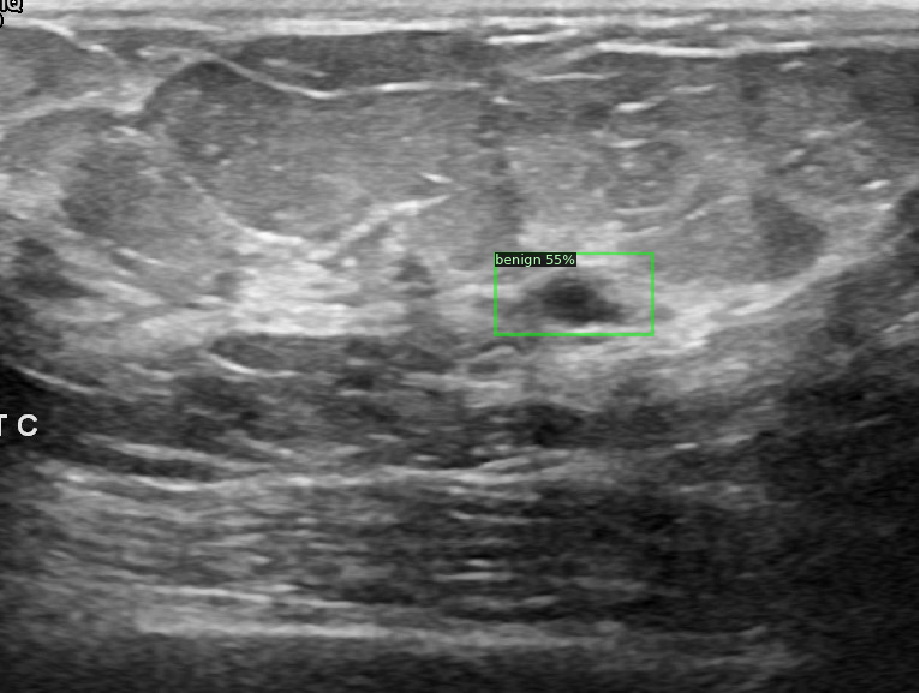

In [ ]:
for img, output in predictions:
    # Create a visualizer instance
    instances = output["instances"].to("cpu")
    print(len(instances), instances.scores)

    if len(instances) > 0:
        # Filter to keep only the instance with the highest score
        max_score_index = instances.scores.argmax().item()

        top_instance = instances[max_score_index]

        v = Visualizer(img[:, :, ::-1],
                      metadata=MetadataCatalog.get(faster_cfg.DATASETS.TRAIN[0]),
                      scale=1.2,
                      instance_mode=ColorMode.IMAGE_BW)

        # Visualize the predictions
        v = v.draw_instance_predictions(top_instance)
        visualized_img = v.get_image()[:, :, ::-1]

    # Display the image
    cv2_imshow(visualized_img)
    cv2.waitKey(0)